In [22]:
import cv2
from IPython.display import Image, Video
import numpy as np

In [164]:
img = cv2.imread('./src/photo.jpg')
img.shape

(4000, 6000, 3)

In [147]:
img[0][0]

array([ 4, 11, 20], dtype=uint8)

In [148]:
for i in range(100):
    for j in range(100):
        for k in range(3):
            img[i][j][k] = 255 # add white block to the picture

In [165]:
cv2.imwrite('photo_test.jpg', img)

True

In [166]:
start = (2750, 2900) # x, y first point of rectangle
end = (3155, 3300) # x, y second point
color = (0, 255, 0)
width = 5

img = cv2.rectangle(img, start, end, color, width)

In [167]:
start = (2750, 2850) # working with text
font_size = 5
font = cv2.FONT_HERSHEY_SIMPLEX
color = (0, 255, 0)
width = 2
text = 'Car'
img = cv2.putText(img, text, start, font, font_size, color, width, cv2.LINE_AA)



In [168]:
cv2.imwrite('photo1_test.jpg', img)

True

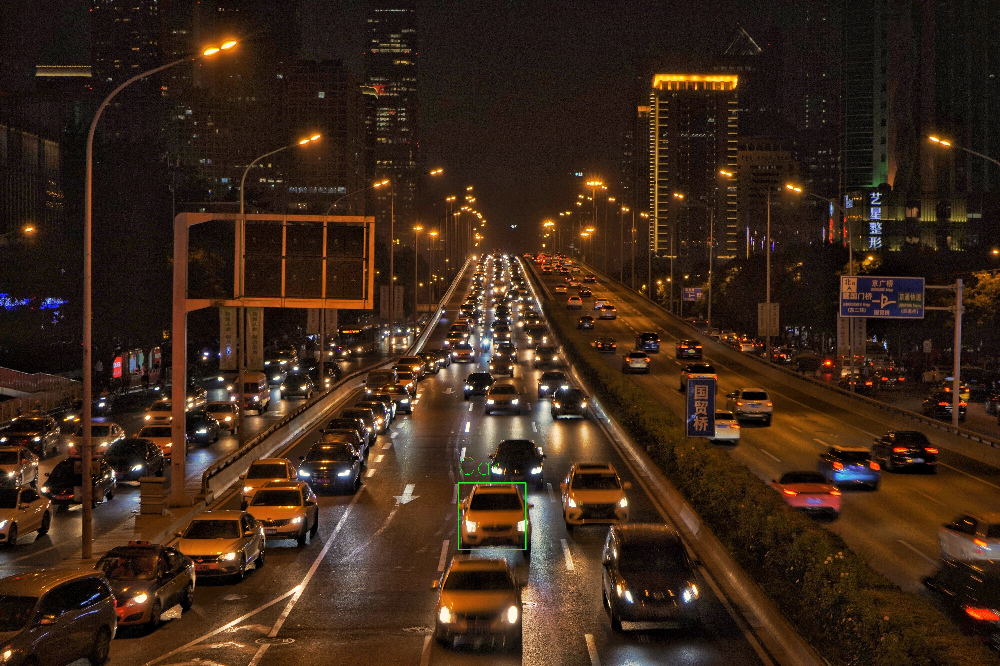

In [169]:
Image('photo1_test.jpg')

In [5]:
net = cv2.dnn.readNet('./net/yolov3.cfg', './net/yolov3-tiny.weights') 

In [6]:
with open('coco.names.txt') as f:
    classes = f.read().split('\n')

In [68]:
img = cv2.imread('./src/photo2.jpg')
height, width, depth = img.shape

In [69]:
blob = cv2.dnn.blobFromImage(img, 1/255, (608, 608), (0,0,0), swapRB=True, crop=False)

In [70]:
net.setInput(blob)

In [71]:
layer_names = net.getLayerNames()
out_layers_indexes = net.getUnconnectedOutLayers()
out_layers = [layer_names[index[0]-1] for index in out_layers_indexes]

In [72]:
outs = net.forward(out_layers)

In [73]:
def draw_object(img, index, score, box):
    x,y,w,h = box
    start = (x, y) # x, y first point of rectangle
    end = (x + w, y + h) # x, y second point
    color = (0, 255, 0)
    width = 2
    img = cv2.rectangle(img, start, end, color, width)

    start = (x, y-10)
    font_size = 5
    font = cv2.FONT_HERSHEY_SIMPLEX
    color = (0, 255, 0)
    width = 2
    text = classes[index]

    img = cv2.putText(img, text, start, font, font_size, color, width, cv2.LINE_AA)

    return img

In [74]:
class_scores = []
class_indexes = []
boxes = []
for out in outs:
    for obj in out:
        scores = obj[5:]
        class_index = np.argmax(scores)
        class_score = scores[class_index]
        if class_score > 0:
            center_x = int(obj[0] * width)
            center_y = int(obj[1] * height)
            obj_width = int(obj[2] * width)
            obj_height = int(obj[3] * height)

            x = center_x - obj_width // 2
            y = center_y - obj_height // 2

            box = [x, y, obj_width, obj_height]
            boxes.append(box)
            class_indexes.append(class_index)
            class_scores.append(float(class_score))

In [75]:
chosen_boxes = cv2.dnn.NMSBoxes(boxes, class_scores, 0, 0.4)

In [76]:
for box_index in chosen_boxes:
    box_index = box_index[0]
    img = draw_object(img, class_indexes[box_index], class_scores[box_index], boxes[box_index])

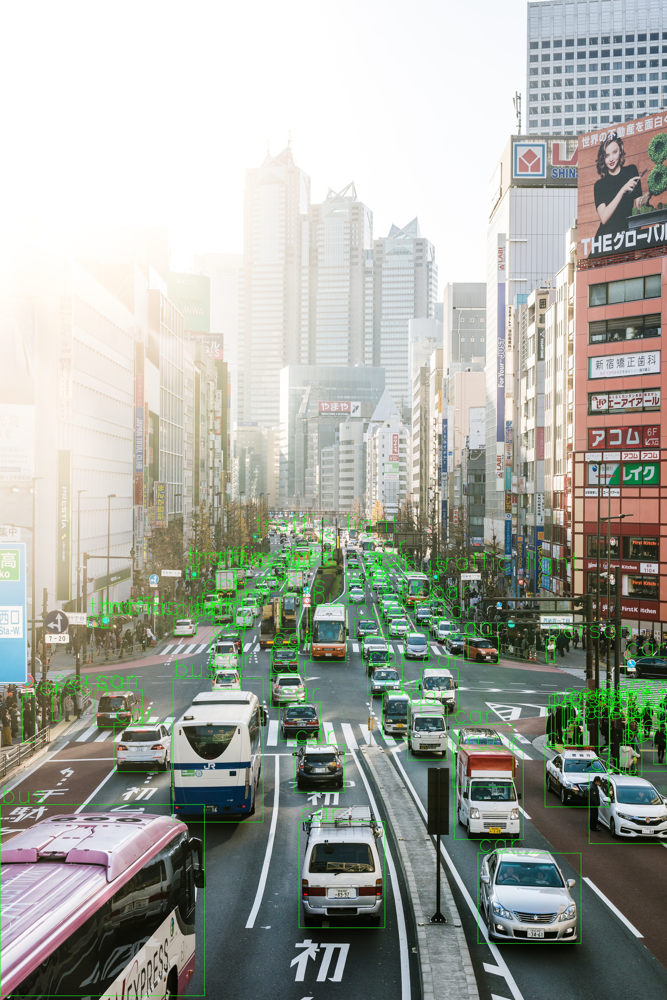

In [77]:
cv2.imwrite('photo_test.jpg', img)
Image('photo_test.jpg')